In [2]:
# devtools::load_all('~/Numbat')
options(repr.matrix.max.cols=30, repr.matrix.max.rows=20)
options(repr.vector.max.items = 50)
library(ggplot2)
library(dplyr)
library(Matrix)
library(data.table)
library(magrittr)
library(IRdisplay)
library(parallel)
library(stringr)
library(purrr)
library(patchwork)
library(glue)
library(ggridges)
library(numbat)

In [3]:
cell_annot = fread('~/paper_data/cell_annotations/cell_annot_WASHU.tsv') %>% 
    mutate(sample_id = str_replace(sample_id, '-', '_')) %>%
    mutate(sample_id = ifelse(sample_id == '57075_Pre_transplant', '57075_Primary', sample_id)) %>%
    mutate(cell = paste0(sample_id, '_', barcode)) %>% 
    split(.$sample_id)

gene_order = fread('/home/tenggao/inferCNV/hg38_gene_order.txt') %>%
    setNames(c('gene', 'chr', 'start', 'end'))

chrom_sizes = fread('~/ref/hg38.chrom.sizes.txt') %>% 
    setNames(c('CHROM', 'size')) %>%
    mutate(CHROM = str_remove(CHROM, 'chr')) %>%
    filter(CHROM %in% 1:22) %>%
    mutate(CHROM = factor(CHROM))

In [9]:
con_washu = readRDS("~/paper_data/conos_objects/conos_WASHU.rds")

In [13]:
count_mat = c()
df = c()

samples = c('47491_Primary', '27522_Relapse_2', '59114_Relapse_1', '37692_Primary', '58408_Primary')

for (sample in samples) {
    count_mat[[sample]] = as.matrix(t(con_washu$samples[[sample]]$misc$rawCounts))
    cells = intersect(cell_annot[[sample]]$cell, colnames(count_mat[[sample]]))
    cell_annot[[sample]] = cell_annot[[sample]] %>% filter(cell %in% cells)
    count_mat[[sample]] = count_mat[[sample]][,cells]
    df[[sample]] = fread(glue('~/paper_data/processed/{sample}_allele_counts.tsv.gz'), sep = '\t') %>%
        filter(cell %in% cells)
}

In [24]:
scores = list()
purple = list()

# utility functions

In [155]:
get_bulk_infercnv = function(sample, segs_dna, tumor_cells) {
    
    # inferCNV
    cna.infercnv = fread(glue('~/paper_data/infercnv_out/{sample}/infercnv.observations.txt')) %>% 
        rename(gene = V1) %>% suppressWarnings()

    cna.infercnv = cna.infercnv %>% 
        left_join(gene_order, by = 'gene') %>%
        mutate(CHROM = str_remove(chr, 'chr'), .before = 1) %>%
        mutate(CHROM = factor(CHROM, unique(CHROM))) %>%
        mutate(POS = start) %>%
        select(-chr, -end, -start)

    aggregate_seg(cna.infercnv, segs_dna, tumor_cells)
    
}

get_bulk_copykat = function(sample, segs_dna, tumor_cells) {
    
    cna.copykat = fread(glue('~/paper_data/copykat_out/{sample}/{sample}_copykat_CNA_results.txt')) %>%
        as.data.frame() %>%
        rename(CHROM = chrom, POS = chrompos)

    colnames(cna.copykat) = colnames(cna.copykat) %>% str_remove('^X') %>% str_replace('\\.1', '-1')

    cna.copykat = cna.copykat %>% select(CHROM, POS, any_of(tumor_cells))

    aggregate_seg(cna.copykat, segs_dna, tumor_cells)
    
}

get_bulk_numbat = function(bulk, segs_dna) {
    
    bulk = bulk %>% 
        group_by(seg) %>%
        mutate(
            approx_lik_exp(
                Y_obs[!is.na(Y_obs)], lambda_ref[!is.na(Y_obs)], unique(na.omit(d_obs)),
                mu = mu[!is.na(Y_obs)],
                sig = sig[!is.na(Y_obs)]
            )
        ) %>%
        mutate(seg_0 = seg)

    bulk = annot_consensus(
            bulk, 
            segs_dna
        ) %>%
        mutate(
            seg_dna = seg,
            seg = seg_0
        ) %>%
        group_by(seg) %>%
        mutate(seg_start = min(POS), seg_end = max(POS)) %>%
        ungroup()
    
    return(bulk)
    
}

aggregate_seg = function(cna, segs_dna, tumor_cells) {
    
    bulk = cna %>%
        select(CHROM, POS) %>%
        mutate(
            score = cna %>% select(any_of(tumor_cells)) %>% rowMeans
        ) %>%
        filter(CHROM %in% 1:22) %>%
        mutate(snp_id = paste0(CHROM, '_', POS)) %>%
        group_by(CHROM) %>%
        arrange(POS) %>%
        mutate(
            seg_start = POS,
            seg_end = c(POS[2:length(POS)], POS[length(POS)])
        ) %>%
        ungroup() %>%
        mutate(
            seg_0 = 1:n(),
            seg_start_0 = seg_start,
            seg_end_0 = seg_end
        )

    # normalize the baseline
    # baseline = bulk %>% filter(CHROM %in% baseline_chroms) %>% pull(score) %>% median
    # bulk = bulk %>% mutate(score = score - baseline)

    bulk = annot_consensus(bulk, segs_dna) %>%
        mutate(
            seg_dna = seg,
            seg = seg_0,
            seg_start = seg_start_0,
            seg_end = seg_end_0
        ) %>%
        mutate(seg = as.character(seg))
    
    return(bulk)
    
}

load_purple = function(sample) {
    cob_segs = fread(glue('~/paper_data/purple_out/{sample}/cobalt/{sample}.cobalt.ratio.pcf')) %>%
        rename(CHROM = chrom) %>%
        mutate(CHROM = str_remove(CHROM, 'chr'))  %>%
        filter(CHROM %in% 1:22) %>%
        mutate(CHROM = factor(CHROM, unique(CHROM)))
    
    cob_markers = fread(glue('~/paper_data/purple_out/{sample}/cobalt/{sample}.cobalt.ratio.tsv')) %>%
        rename(CHROM = chromosome, POS = position) %>%
        mutate(logR = log2(tumorGCRatio)) %>%
        mutate(CHROM = str_remove(CHROM, 'chr'))  %>%
        filter(CHROM %in% 1:22) %>%
        filter(logR != -1) %>%
        mutate(CHROM = factor(CHROM, unique(CHROM)))

    amber = fread(glue('~/paper_data/purple_out/{sample}/amber/{sample}.amber.baf.tsv')) %>%
        rename(CHROM = chromosome) %>%
        mutate(CHROM = str_remove(CHROM, 'chr'))  %>%
        filter(CHROM %in% 1:22) %>%
        mutate(CHROM = factor(CHROM, unique(CHROM)))

    purple_cnv =  fread(glue('~/paper_data/purple_out/{sample}/purple/{sample}.purple.cnv.somatic.tsv')) %>%
        rename(CHROM = chromosome) %>%
        mutate(CHROM = str_remove(CHROM, 'chr'))  %>%
        filter(CHROM %in% 1:22) %>%
        mutate(CHROM = factor(CHROM, unique(CHROM)))

    purple_segments = fread(glue('~/paper_data/purple_out/{sample}/purple/{sample}.purple.segment.tsv')) %>%
        rename(CHROM = chromosome) %>%
        mutate(CHROM = str_remove(CHROM, 'chr'))  %>%
        filter(CHROM %in% 1:22) %>%
        mutate(CHROM = factor(CHROM, unique(CHROM)))
    
    f = glue('~/paper_data/purple_out/{sample}/purple/segs_new.tsv')
    
    if (file.exists(f)) {
        segs_smooth = fread(f) %>%
            mutate(CHROM = factor(CHROM, unique(CHROM)))
    } else {
        segs_smooth = NULL
    }
    
    return(list('cob_segs' = cob_segs, 'cob_markers' = cob_markers, 'amber' = amber,
                'cnv' = purple_cnv, 'segs' = purple_segments, 'segs_smooth' = segs_smooth))
}

# re-segmentation

In [31]:
dat = purple[[sample]]$cob_markers %>% 
    select(CHROM, POS, logR) %>%
    as.data.frame() %>%
    copynumber::winsorize(return.outliers=F, verbose=FALSE) %>%
    rename(CHROM = chrom, POS = pos) %>%
    mutate(CHROM = factor(CHROM, unique(CHROM)))

segs = copynumber::pcf(data = dat, gamma = 12000, verbose = F)

segs = segs %>%
    rename(CHROM = chrom, seg_start = start.pos, seg_end = end.pos, logR = mean) %>%
    mutate(CHROM = factor(CHROM, unique(CHROM)))

In [32]:
dat %>% fwrite(glue('~/external/WASHU/{sample}/purple/logR_winsorized.tsv'), sep = '\t')
segs %>% fwrite(glue('~/external/WASHU/{sample}/purple/segs_new.tsv'), sep = '\t')

# Overall CNV detection 

## scoring functions

In [221]:
plot_purple = function(purple) {
        
    purple$cnv = purple$cnv %>% mutate(aberrant = copyNumber > 2.5 | copyNumber < 1.5)
    
    diploid_chroms = purple$cnv %>% group_by(CHROM) %>%
        summarise(diploid = all(copyNumber < 2.2 & copyNumber > 1.8)) %>%
        filter(diploid) %>%
        pull(CHROM)

    baseline = purple$cob_markers %>% filter(CHROM %in% diploid_chroms) %>% pull(logR) %>% median
    
    cob_markers = purple$cob_markers %>% 
        mutate(logR = logR - baseline) %>%
        sample_frac(0.01) %>%
        filter(logR < 1.5 & logR > -1.5) %>%
        mutate(variable = factor('TCN', c('TCN', 'BAF')))
    
    if (!is.null(purple$segs_smooth)) {
        segs_smooth = purple$segs_smooth %>%
            mutate(logR = logR - baseline) %>%
            filter(logR < 1.5 & logR > -1.5) %>%
            mutate(variable = factor('TCN', c('TCN', 'BAF'))) %>%
            mutate(aberrant = logR > 0.25 | logR < -0.25)
    }
    
    p = purple$amber %>% 
        mutate(variable = factor('BAF', c('TCN', 'BAF'))) %>%
        sample_frac(0.2) %>%
        ggplot() +
        geom_point(
            aes(x = position, y = tumorBAF),
            size = 0.2, alpha = 0.02, pch = 16
        ) +
        geom_point(
            data = data.frame(
                tumorBAF = c(0,1)
            ),
            aes(x = 1, y = tumorBAF),
            size = 0, alpha = 0
        ) +
        geom_point(
            data = cob_markers,
            size = 0.1, color = 'gray', alpha = 0.2,
            aes(x = POS, y = logR)
        ) +
    #     geom_segment(
    #         inherit.aes = F,
    #         data = purple$cnv %>% 
    #             filter(copyNumber < 5 & (end - start) > 1e6 & depthWindowCount > 10) %>%
    #             mutate(variable = factor('TCN', c('TCN', 'BAF'))),
    #         aes(x = start, xend = end, y = log2(copyNumber/2), yend = log2(copyNumber/2), color = aberrant),
    #         size = 1
    #     ) +
        geom_segment(
            data = purple$segs %>% 
                filter(bafCount > 30) %>%
            mutate(variable = factor('BAF', c('TCN', 'BAF'))),
            aes(x = start, xend = end, y = observedBAF, yend = observedBAF),
            size = 1,
            color = 'blue'
        ) +
        geom_segment(
            data = purple$segs %>% 
                filter(bafCount > 30) %>%
            mutate(variable = factor('BAF', c('TCN', 'BAF'))),
            aes(x = start, xend = end, y = 1-observedBAF, yend = 1-observedBAF),
            size = 1,
            color = 'blue'
        ) +
    #     geom_rect(
    #         data = acen %>% 
    #             mutate(CHROM = str_remove(CHROM, 'chr')) %>% 
    #             filter(CHROM %in% 1:22) %>%
    #             mutate(CHROM = factor(CHROM)) %>%
    #             group_by(CHROM) %>%
    #             summarise(start = min(start), end = max(end)),
    #         aes(xmin = start, xmax = end, ymin = -Inf, ymax = Inf),
    #         fill = 'gray',
    #         alpha = 0.5
    #     ) +
        facet_grid(variable~CHROM, space = 'free_x', scale = 'free') +
        scale_color_manual(values = c('black', 'red')) +
        theme_classic() +
        theme(
            panel.spacing.x = unit(0, 'mm'),
            panel.spacing.y = unit(1, 'mm'),
            panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
            axis.text.x = element_blank(),
            strip.background = element_blank()
        ) +
        guides(color = FALSE) +
        xlab('Genomic position') +
        ylab('')
        # geom_hline(yintercept = 2/3, linetype = 'dashed', color = 'darkred', size = 0.5) +
        # geom_hline(yintercept = 1/3, linetype = 'dashed', color = 'darkred', size = 0.5) +
        # geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'darkblue', size = 0.5)
    
    if (!is.null(purple$segs_smooth)) {
        p = p + geom_segment(
                inherit.aes = F,
                data = segs_smooth,
                aes(x = seg_start, xend = seg_end, y = logR, yend = logR, color = aberrant),
                size = 1
            )
    }
    
    return(p)
    
}

hg38_gaps = fread('~/ref/gaps.38.txt') %>%
        setNames(c('CHROM', 'start', 'end')) %>%
        mutate(CHROM = str_remove(CHROM, 'hs')) %>%
        filter(CHROM %in% 1:22) %>%
        mutate(CHROM = as.factor(as.integer(CHROM))) %>%
        arrange(CHROM)

cnv_heatmap = function(segs) {
    
    hg38_gaps_filtered = hg38_gaps %>% filter(end - start > 1e6)
    
    ggplot(
        segs
    ) +
    geom_rect(
        data = chrom_sizes,
        aes(xmin = 0, xmax = size, ymin = -0.5, ymax = 0.5, fill = NA)
    ) +
    geom_rect(
        aes(xmin = seg_start, xmax = seg_end, ymin = -0.5, ymax = 0.5, fill = cnv_state)
    ) +
    geom_rect(
        inherit.aes = F,
        data = hg38_gaps_filtered,
        aes(xmin = start, 
            xmax = end,
            ymin = -0.5,
            ymax = 0.5),
        fill = 'white'
    ) +
    geom_rect(
        inherit.aes = F,
        data = hg38_gaps_filtered,
        aes(xmin = start, 
            xmax = end,
            ymin = -0.5,
            ymax = 0.5),
        fill = 'gray',
        alpha = 0.5
    ) +
    theme_classic() +
    theme(
        panel.spacing = unit(0, 'mm'),
        panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
        strip.background = element_blank(),
        strip.text.y = element_text(angle = 0),
        axis.text = element_blank(),
        plot.margin = margin(0, 0, 0, 0),
        axis.title.x = element_blank(),
        axis.ticks.y = element_blank()
    ) +
    facet_grid(method~CHROM, space = 'free_x', scale = 'free') +
    scale_fill_manual(values = c('neu' = 'white', cnv_colors[names(cnv_colors) != 'neu'])) +
    scale_x_continuous(expand = expansion(add = 0))
}

In [209]:
subtract_ranges = function(gr1, gr2) {
    overlap = GenomicRanges::intersect(gr1, gr2)
    GenomicRanges::setdiff(gr1, overlap)
}

evaluate_calls = function(cnvs_dna, cnvs_call) {
    
    ranges_dna = cnvs_dna %>% {GenomicRanges::GRanges(
            seqnames = .$CHROM,
            IRanges::IRanges(start = .$seg_start,
                end = .$seg_end)
        )}
    
    ranges_call = cnvs_call %>% {GenomicRanges::GRanges(
            seqnames = .$CHROM,
            IRanges::IRanges(start = .$seg_start,
                end = .$seg_end)
        )}
    
    ranges_gap = hg38_gaps %>% {GenomicRanges::GRanges(
            seqnames = .$CHROM,
            IRanges::IRanges(start = .$start,
                end = .$end)
        )}
    
    ranges_dna = subtract_ranges(ranges_dna, ranges_gap)
    ranges_call = subtract_ranges(ranges_call, ranges_gap)
    
    overlap_total = GenomicRanges::intersect(ranges_dna, ranges_call) %>%
        as.data.frame() %>% pull(width) %>% sum
    
    dna_total = ranges_dna %>% as.data.frame() %>% pull(width) %>% sum
    call_total = ranges_call %>% as.data.frame() %>% pull(width) %>% sum
    
    pre = overlap_total/call_total
    rec = overlap_total/dna_total
    
    return(c('precision' = pre, 'recall' = rec))
}

In [979]:
R.utils::sourceDirectory('~/Numbat/R')

bulk_tumors = mclapply(
    mc.cores = length(samples),
    samples,
    function(sample) {
        
        ref_types = c('NK', 'Macrophage', 'CD4+T', 'CD8+T', 'Myeloid', 'Monocyte', 'B', 'Plasma', 'Dendritic')

        if (sample == '27522_Relapse_2') {
            clusters = con_washu$samples[[sample]]$clusters$PCA$multilevel
            clusters = clusters[names(clusters) %in% cell_annot[[sample]]$cell]

            cells = cell_annot[[sample]] %>% 
                mutate(cluster = clusters[cell]) %>%
                filter(cell_type == 'Plasma' & cluster == 4) %>% pull(cell)
        } else {
            cells = cell_annot[[sample]] %>% filter(cell_type == 'Plasma') %>% pull(cell)
        }

        bulk = get_bulk(
                count_mat[[sample]][,cells],
                ref_hca[,ref_types],
                df[[sample]] %>% filter(cell %in% cells),
                gtf_transcript,
                genetic_map_hg38,
                verbose = F
            ) %>%
            mutate(sample = sample) %>%
            analyze_bulk(t = 1e-5, retest = T, lambda = 1)
            
        return(bulk)
    }
) %>%
setNames(samples)

In [787]:
R.utils::sourceDirectory('~/Numbat/R')

bulk_exp_tumors = mclapply(
    mc.cores = length(samples),
    samples,
    function(sample) {
        
        ref_types = c('NK', 'Macrophage', 'CD4+T', 'CD8+T', 'Myeloid', 'Monocyte', 'B', 'Plasma', 'Dendritic')

        if (sample == '27522_Relapse_2') {
            clusters = con_washu$samples[[sample]]$clusters$PCA$multilevel
            clusters = clusters[names(clusters) %in% cell_annot[[sample]]$cell]

            cells = cell_annot[[sample]] %>% 
                mutate(cluster = clusters[cell]) %>%
                filter(cell_type == 'Plasma' & cluster == 4) %>% pull(cell)
        } else {
            cells = cell_annot[[sample]] %>% filter(cell_type == 'Plasma') %>% pull(cell)
        }

        bulk = get_bulk(
                count_mat[[sample]][,cells],
                ref_hca[,ref_types],
                df[[sample]] %>% filter(cell %in% cells),
                gtf_transcript,
                genetic_map_hg38,
                verbose = F
            ) %>%
            mutate(sample = sample) %>%
            analyze_bulk(t = 1e-5, retest = F, exp_only = T) 
            
        return(bulk)
    }
) %>%
setNames(samples)

In [29]:
bulk_tumors = readRDS('~/paper_data/cnv_benchmark/bulk_tumors.rds')
bulk_exp_tumors = readRDS('~/paper_data/cnv_benchmark/bulk_exp_tumors.rds')

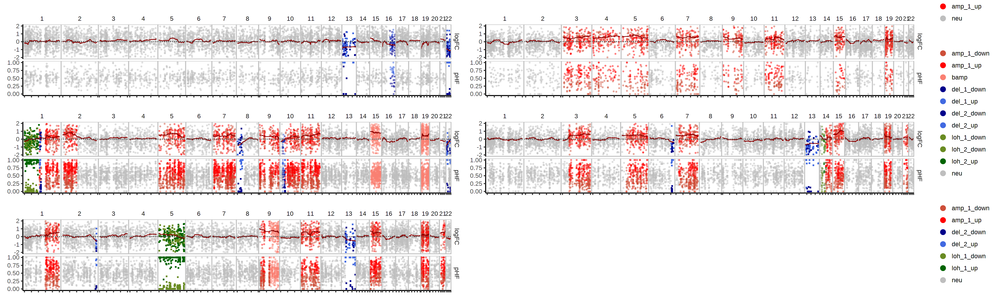

In [64]:
options(repr.plot.width = 20, repr.plot.height = 6, repr.plot.res = 200)

bulk_tumors %>%
bind_rows() %>%
plot_bulks(phi_mle = F, use_pos = TRUE, min_depth = 8, ncol = 2)

Warning message:
“Removed 59635 rows containing missing values (geom_point).”
Warning message:
“Removed 52808 rows containing missing values (geom_point).”
Warning message:
“Removed 124235 rows containing missing values (geom_point).”
Warning message:
“Removed 96781 rows containing missing values (geom_point).”
Warning message:
“Removed 117225 rows containing missing values (geom_point).”


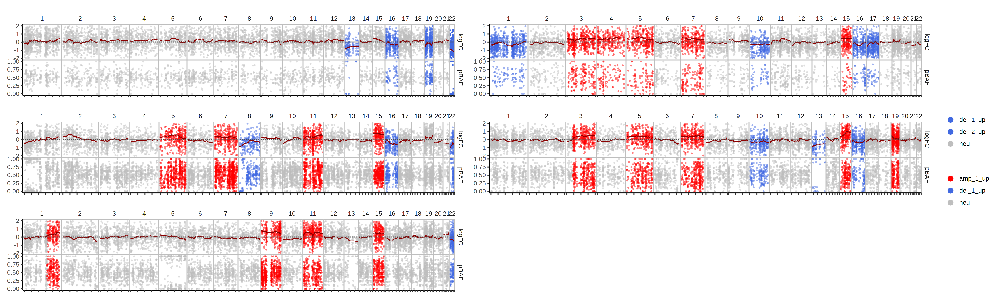

In [788]:
options(repr.plot.width = 20, repr.plot.height = 6, repr.plot.res = 200)

bulk_exp_tumors %>%
bind_rows() %>%
plot_bulks(phi_mle = F, use_pos = TRUE, min_depth = 8, ncol = 2)

In [34]:
samples = c('47491_Primary', '27522_Relapse_2', '59114_Relapse_1', '37692_Primary', '58408_Primary')

for (sample in samples) {
    purple[[sample]] = load_purple(sample)
}

Warning message in mask$eval_all_mutate(quo):
“NaNs produced”
Warning message in mask$eval_all_mutate(quo):
“NaNs produced”
Warning message in mask$eval_all_mutate(quo):
“NaNs produced”
Warning message in mask$eval_all_mutate(quo):
“NaNs produced”
Warning message in mask$eval_all_mutate(quo):
“NaNs produced”


In [210]:
# bulk_all = c()

for (sample in samples) {
    
    message(sample)
    
    diploid_chroms = purple[[sample]]$cnv %>% group_by(CHROM) %>%
        summarise(diploid = all(copyNumber < 2.2 & copyNumber > 1.8)) %>%
        filter(diploid) %>%
        pull(CHROM)

    baseline = purple[[sample]]$segs_smooth %>% filter(CHROM %in% diploid_chroms) %>% pull(logR) %>% median

    segs_dna = purple[[sample]]$segs_smooth %>%
        mutate(seg = as.character(1:n()), seg_cons = seg) %>%
        mutate(logR = logR - baseline)

    # get the BAFs for smoothed segments
    segs_baf = purple[[sample]]$amber %>%
        rename(POS = position) %>%
        mutate(snp_id = paste0(CHROM, '_', POS)) %>%
        annot_consensus(segs_dna) %>%
        group_by(CHROM, seg) %>%
        summarise(
            BAF = mean(tumorModifiedBAF),
            .groups = 'drop'
        )

    segs_dna = segs_dna %>%
        left_join(segs_baf, by = c('CHROM', 'seg'))

    if (sample == '27522_Relapse_2') {
        clusters = con_washu$samples[[sample]]$clusters$PCA$multilevel
        clusters = clusters[names(clusters) %in% cell_annot[[sample]]$cell]

        tumor_cells = cell_annot[[sample]] %>% 
            mutate(cluster = clusters[cell]) %>%
            filter(cell_type == 'Plasma' & cluster == 4) %>% pull(cell)
    } else {
        tumor_cells = cell_annot[[sample]] %>% filter(cell_type == 'Plasma') %>% pull(cell)
    }

    bulk_infercnv = get_bulk_infercnv(sample, segs_dna, tumor_cells)
    bulk_copykat = get_bulk_copykat(sample, segs_dna, tumor_cells)
    bulk_numbat = get_bulk_numbat(bulk_tumors[[sample]], segs_dna)
    bulk_exp_numbat = get_bulk_numbat(bulk_exp_tumors[[sample]], segs_dna)
    
    cnvs_dna = segs_dna %>%
        filter(n.probes > 410) %>%
        mutate(cnv_state = case_when(
            logR > 0.25 ~ 'amp',
            logR < -0.25 ~ 'del',
            BAF > 0.75 ~ 'loh',
            T ~ 'neu')
        ) %>%
        mutate(
            cnv_state = ifelse(cnv_state == 'amp' & BAF < 0.58, 'bamp', cnv_state)
        ) %>%
        filter(cnv_state != 'neu') %>%
        mutate(length = seg_end - seg_start)

    segs_numbat = bulk_numbat %>%
        mutate(cnv_state = cnv_state_post) %>%
        distinct(CHROM, seg, cnv_state, seg_start, seg_end) %>%
        filter(cnv_state != 'neu') %>%
        mutate(length = seg_end - seg_start)
    
    segs_exp_numbat = bulk_exp_numbat %>%
        distinct(CHROM, seg, cnv_state, seg_start, seg_end) %>%
        filter(cnv_state != 'neu') %>%
        mutate(length = seg_end - seg_start)

    infercnv.hmm = fread(glue('~/paper_data/infercnv_out/{sample}/HMM_CNV_predictions.HMMi6.hmm_mode-samples.Pnorm_0.5.pred_cnv_regions.dat'))

    segs_infercnv = infercnv.hmm %>% filter(cell_group_name == 'Plasma') %>%
        mutate(CHROM = str_remove(chr, 'chr')) %>%
        mutate(CHROM = factor(CHROM, unique(CHROM))) %>%
        mutate(cnv_state = c('1' = 'bdel', '2' = 'del', '3' = 'neu', '4' = 'amp', '5' = 'bamp', '6' = 'amp')[state]) %>%
        rename(seg_start = start, seg_end = end) %>%
        mutate(length = seg_end - seg_start)

    segs_copykat = bulk_copykat %>% 
        mutate(cnv_state = case_when(
            score > 0.03 ~ 'amp',
            score < -0.03 ~ 'del',
            T ~ 'neu'
        )) %>%
        filter(cnv_state != 'neu') %>%
        mutate(length = seg_end - seg_start)
    
    segs_hb = fread(glue('~/paper_data/honeybadger_out/{sample}_segs_all.tsv')) %>%
        mutate(
            CHROM = factor(CHROM),
            sample = sample
        ) %>%
        filter(cnv_state != 'neu')
    
    scores[[sample]] = rbind(
            evaluate_calls(cnvs_dna, segs_numbat) %>% t,
            evaluate_calls(cnvs_dna, segs_exp_numbat) %>% t,
            evaluate_calls(cnvs_dna, segs_hb) %>% t,
            evaluate_calls(cnvs_dna, segs_infercnv) %>% t,
            evaluate_calls(cnvs_dna, segs_copykat) %>% t
        ) %>%
        as.data.frame() %>%
        mutate(
            sample = sample,
            method = c('Numbat', 'Numbat-exp', 'HoneyBADGER', 'InferCNV', 'CopyKAT')
        ) %>%
        mutate(method = factor(method, unique(method)))

    bulk_all[[sample]] = bind_rows(
            cnvs_dna %>% mutate(method = 'DNA'),
            segs_numbat %>% mutate(method = 'Numbat'),
            segs_exp_numbat %>% mutate(method = 'Numbat-exp'),
            segs_hb %>% mutate(method = 'HoneyBADGER'),
            segs_infercnv %>% mutate(method = 'InferCNV'),
            segs_copykat %>% mutate(method = 'CopyKAT')
        ) %>%
        mutate(
            sample = sample,
            method = factor(method, unique(method))
        )
}

47491_Primary

27522_Relapse_2

59114_Relapse_1

37692_Primary

58408_Primary



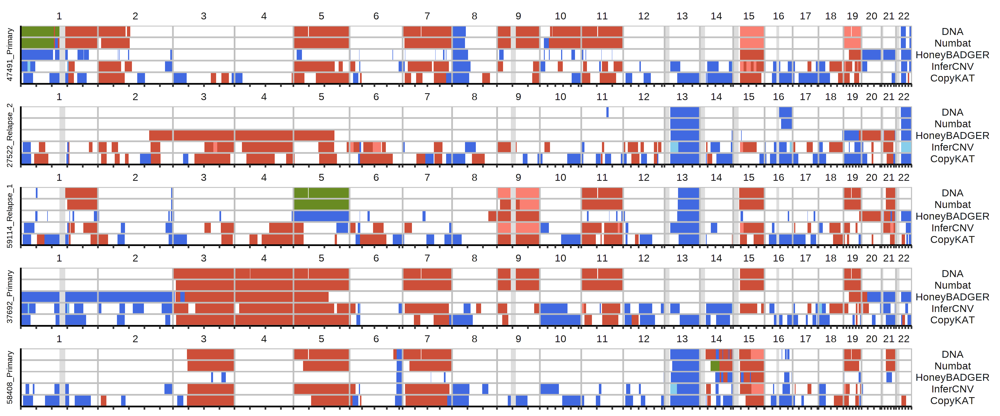

In [199]:
options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 300)

bulk_all[samples] %>%
lapply(
    function(segs){
        segs %>%
        filter(method != 'Numbat-exp') %>%
        cnv_heatmap() +
        ylab(unique(na.omit(segs$sample))) +
        theme(
            axis.title.y = element_text(size = 6.5)
        ) +
        guides(fill = 'none')
    }
) %>%
wrap_plots(ncol = 1) +
plot_layout(guides = 'collect')

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



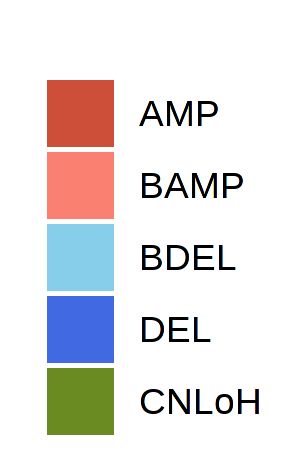

In [56]:
options(repr.plot.width = 1, repr.plot.height = 1.5, repr.plot.res = 300)

p = bulk_all[[1]] %>% 
    filter(cnv_state %in% c('amp', 'del', 'loh', 'bamp', 'bdel')) %>%
    cnv_heatmap() +
    scale_fill_manual(
        values = c(neu = "white", cnv_colors[names(cnv_colors) != 
            "neu"]),
        labels = c('amp' = 'AMP', 'bamp' = 'BAMP', 'bdel' = 'BDEL', 'del' = 'DEL', 'loh' = 'CNLoH'),
        name = ''
    )

ggpubr::get_legend(p) %>%
ggpubr::as_ggplot()

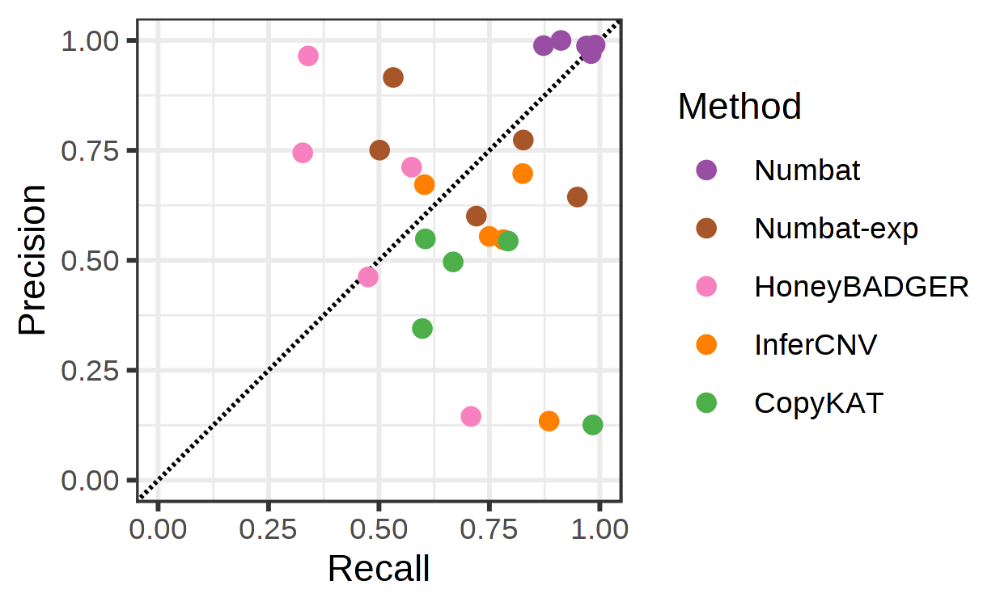

In [213]:
options(repr.plot.width = 4.12, repr.plot.height = 2.5, repr.plot.res = 300)

scores %>% 
bind_rows() %>%
filter(sample %in% samples) %>%
ggplot(
    aes(x = recall, y = precision, color = method)
) +
geom_abline(linetype = 'dashed') +
geom_point(size = 2) +
theme_bw() +
xlim(0,1) +
ylim(0,1) +
# scale_color_manual(values = c('Copykat' = pal[3], 'Numbat' = pal[4], 'inferCNV' = pal[5]))
scale_color_manual(
    name = 'Method',
    values = c('CopyKAT' = pal[3], 'Numbat' = pal[4], 'Numbat-exp' = pal[7], 'InferCNV' = pal[5], 'HoneyBADGER' = pal[8])
) +
xlab('Recall') +
ylab('Precision')

In [212]:
scores %>% bind_rows %>% 
filter(method == 'Numbat')

precision,recall,sample,method
<dbl>,<dbl>,<chr>,<fct>
0.9700625,0.9802814,47491_Primary,Numbat
1.0000000,0.9120690,27522_Relapse_2,Numbat
0.9874423,0.9699149,59114_Relapse_1,Numbat
0.9895109,0.9892848,37692_Primary,Numbat
0.9882687,0.8726424,58408_Primary,Numbat


In [218]:
scores %>% bind_rows %>% 
filter(method == 'Numbat') %>%
filter(sample %in% samples) %>%
summarise_at(c('precision', 'recall'), mean) %>% 
signif(2)

precision,recall
<dbl>,<dbl>
0.99,0.94


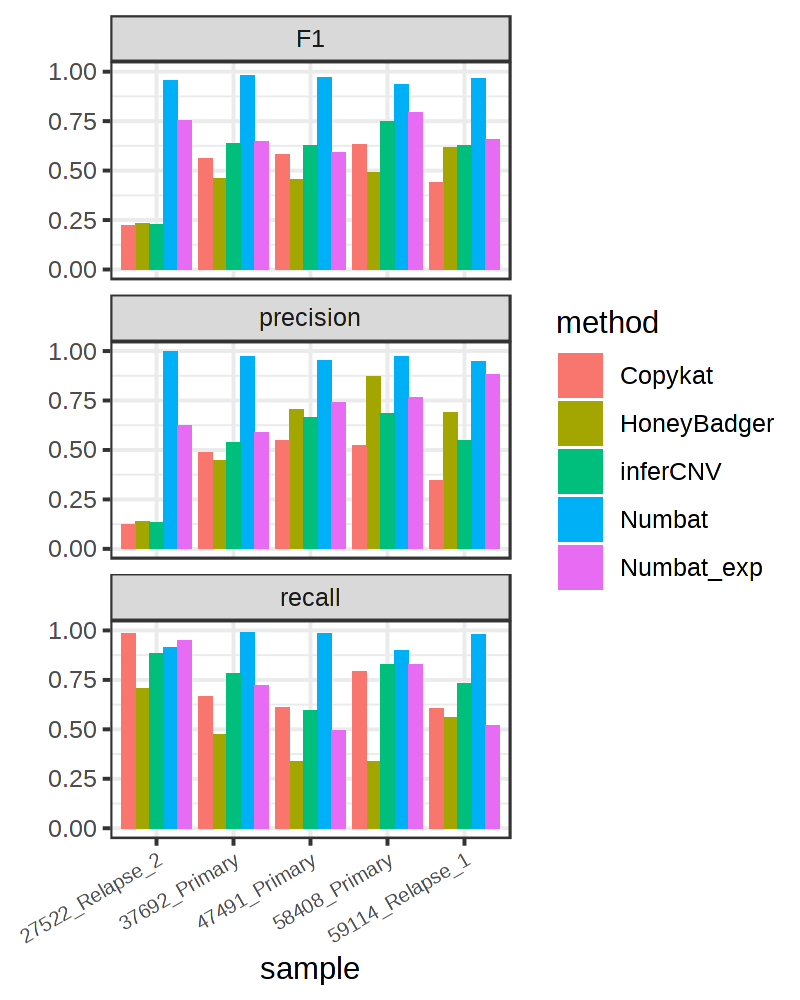

In [860]:
options(repr.plot.width = 4, repr.plot.height = 5, repr.plot.res = 200)

scores %>% 
bind_rows() %>%
filter(sample %in% samples) %>%
mutate(F1 = 2 * (precision * recall)/(precision + recall)) %>%
reshape2::melt(measure.vars = c('recall', 'precision', 'F1')) %>%
mutate(variable = factor(variable, c('F1', 'precision', 'recall'))) %>%
ggplot(
    aes(x = sample, y = value, fill = method)
) +
geom_col(position = position_dodge()) +
theme_bw() +
# ylim(0,1) +
ylab('') +
facet_wrap(~variable, ncol = 1) +
theme(axis.text.x = element_text(angle = 30, hjust = 1, size = 7))

## DNA/RNA side-by-side

In [222]:
options(repr.plot.width = 14, repr.plot.height = 4.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

p_dna = list()
p_numbat = list()

for (sample in samples) {
    
    p_dna[[sample]] = plot_purple(purple[[sample]]) + 
        ggtitle(sample) +
        geom_segment(
            inherit.aes = F,
            data = chrom_sizes,
            aes(x = 0, xend = size, y = 0, yend = 0),
            alpha = 0
        )
        
    p_numbat[[sample]] = bulk_tumors[[sample]] %>%
        mutate(CHROM = factor(CHROM)) %>%
        plot_psbulk(phi_mle = TRUE, use_pos = TRUE, min_depth = 8, legend = F) +
        geom_segment(
            inherit.aes = F,
            data = chrom_sizes,
            aes(x = 0, xend = size, y = 0, yend = 0),
            alpha = 0
        )
}

Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”


Warning message:
“Removed 17 rows containing missing values (geom_segment).”


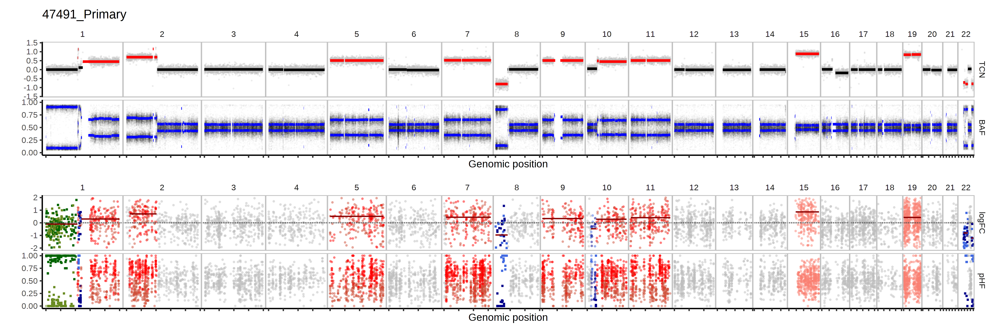

In [223]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 300)

wrap_plots(
    list(p_dna[['47491_Primary']], p_numbat[['47491_Primary']]),
    ncol = 1, byrow = F
)

Warning message:
“Removed 17 rows containing missing values (geom_segment).”
Warning message:
“Removed 20 rows containing missing values (geom_segment).”
Warning message:
“Removed 17 rows containing missing values (geom_segment).”
Warning message:
“Removed 15 rows containing missing values (geom_segment).”
Warning message:
“Removed 21 rows containing missing values (geom_segment).”


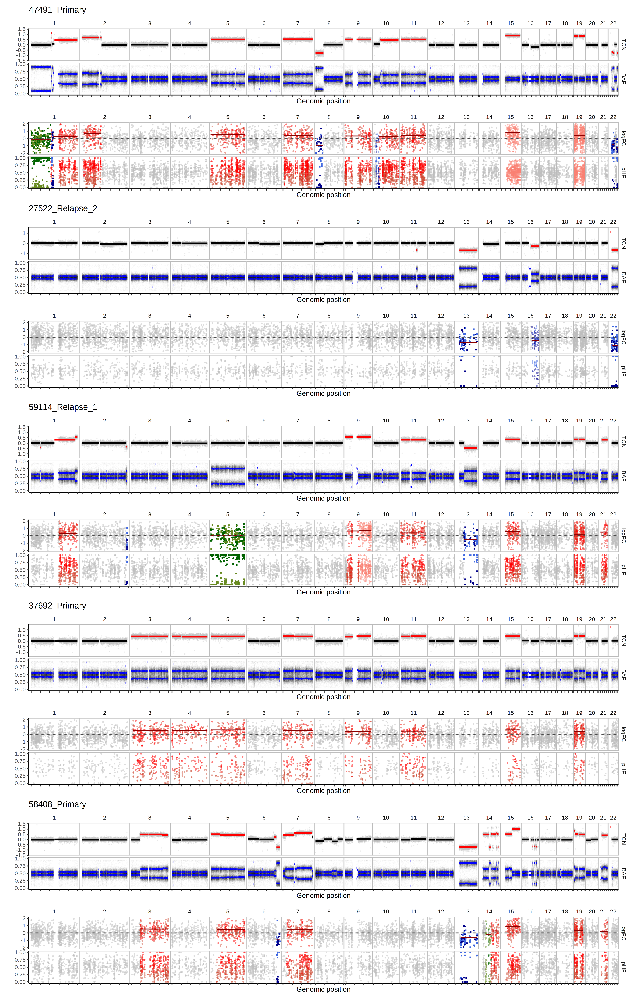

In [224]:
options(repr.plot.width = 14, repr.plot.height = 22, repr.plot.res = 300)

wrap_plots(c(rbind(p_dna, p_numbat)), ncol = 1, byrow = F, guides = 'keep')